In [306]:
import pickle

In [311]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set_style('whitegrid')
import plotly.offline as py
import plotly.graph_objs as go
import plotly.express as px

In [2]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import ElasticNet
from sklearn.svm import SVR
from sklearn.linear_model import Ridge
from sklearn.linear_model import BayesianRidge

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error

import category_encoders as ce
import warnings
warnings.filterwarnings('ignore')
import sweetviz as sv

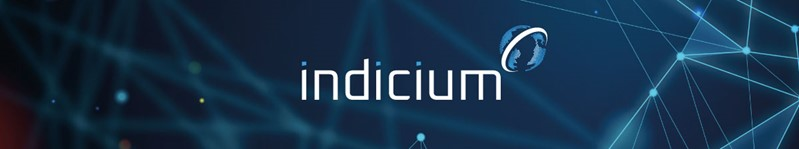

## 1. Introdução e Contextualização

O estudo a seguir faz parte do desafio do processo seletivo da **Lighthouse**, proposto da seguinte forma: você foi alocado(a) em um time da Indicium que está trabalhando atualmente junto a um cliente no processo de criação de uma plataforma de aluguéis temporários na cidade de Nova York. Para o desenvolvimento de sua estratégia de precificação, pediu para que a Indicium fizesse uma análise exploratória dos dados de seu maior concorrente, assim como um teste de validação de um modelo preditivo.

Tendo isso em vista, o seguinte projeto tem como finalidade desenvolver um modelo de machine learning capaz de prever os preços de casas com base em uma variedade de características e atributos. Ao utilizar o conjunto de dados fornecido e técnicas de modelagem, o principal objetivo é fornecer uma ferramenta que possa auxiliar a empresa no seu desenvolvimento de estratégias para a precificação dos imóveis disponíveis para aluguel. 

Para obter êxito nessa tarefa, utilizarei-me de uma abordagem acerca dos fatores que influenciam no preço de casas, a exemplos, a localização e posição geográficas e tipos de quartos. O modelo será construído para buscar uma solução robusta e precisa que possa ser generalizada para novos dados e cenários. 



A base de dados de treinamento contém 16 colunas. A descrição das colunas é:

**id** - Atua como uma chave exclusiva para cada anúncio nos dados do aplicativo

**nome** - Representa o nome do anúncio

**host_id** - Representa o id do usuário que hospedou o anúncio

**host_name** - Contém o nome do usuário que hospedou o anúncio

**bairro_group** - Contém o nome do bairro onde o anúncio está localizado

**bairro** - Contém o nome da área onde o anúncio está localizado

**latitude** - Contém a latitude do local

**longitude** - Contém a longitude do local

**room_type** - Contém o tipo de espaço de cada anúncio

**price** - Contém o preço por noite em dólares listado pelo anfitrião

**minimo_noites** - Contém o número mínimo de noites que o usuário deve reservar

**numero_de_reviews** - Contém o número de comentários dados a cada listagem

**ultima_review** - Contém a data da última revisão dada à listagem

**reviews_por_mes** - Contém o número de avaliações fornecidas por mês

**calculado_host_listings_count** - Contém a quantidade de listagem por host

**disponibilidade_365** - Contém o número de dias em que o anúncio está disponível para reserva


In [208]:
# carregando os dados do dataframe e analisando suas informações

df = pd.read_csv('teste_indicium_precificacao.csv')
df.head(1)

,id,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,ultima_review,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
0,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75,-73.98,Entire home/apt,225,1,45,2019-05-21,0.38,2,355


In [176]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48894 entries, 0 to 48893
Data columns (total 16 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   id                             48894 non-null  int64  
 1   nome                           48878 non-null  object 
 2   host_id                        48894 non-null  int64  
 3   host_name                      48873 non-null  object 
 4   bairro_group                   48894 non-null  object 
 5   bairro                         48894 non-null  object 
 6   latitude                       48894 non-null  float64
 7   longitude                      48894 non-null  float64
 8   room_type                      48894 non-null  object 
 9   price                          48894 non-null  int64  
 10  minimo_noites                  48894 non-null  int64  
 11  numero_de_reviews              48894 non-null  int64  
 12  ultima_review                  38842 non-null 

In [177]:
# checando duplicados

df.duplicated().sum()

0

In [178]:
print(f'O dataset fornecido possui {df.shape[0]} linhas e {df.shape[1]} colunas e nenhum dado duplicado!')
print('Analisando-as, infere-se que existem dados faltantes, que devem ser tratados antes do desenvolvimento do modelo.')
print('Mas, antes disso, vamos fazer uma análise exploratória para entender melhor os dados com os quais estamos \
trabalhando!')

O dataset fornecido possui 48894 linhas e 16 colunas e nenhum dado duplicado!
Analisando-as, infere-se que existem dados faltantes, que devem ser tratados antes do desenvolvimento do modelo.
Mas, antes disso, vamos fazer uma análise exploratória para entender melhor os dados com os quais estamos trabalhando!


## 2 Análise Explorátoria dos Dados (EDA)

Quando trabalhamos com Ciência de Dados, é muito importante iniciar o desenvolvimento de um modelo de Machine Learning pela análise dos dados fornecidos. É essa exploração que fornecerá informações relevantes sobre os dados disponíveis e ajudará na seleção das variáveis relevantes na precificação dos imóveis.

Para isso, começaremos olhando graficamente a relação das variáveis categóricas "room_type" e "bairro_group" e a quantidade de vezes que elas aparecem no dataset.

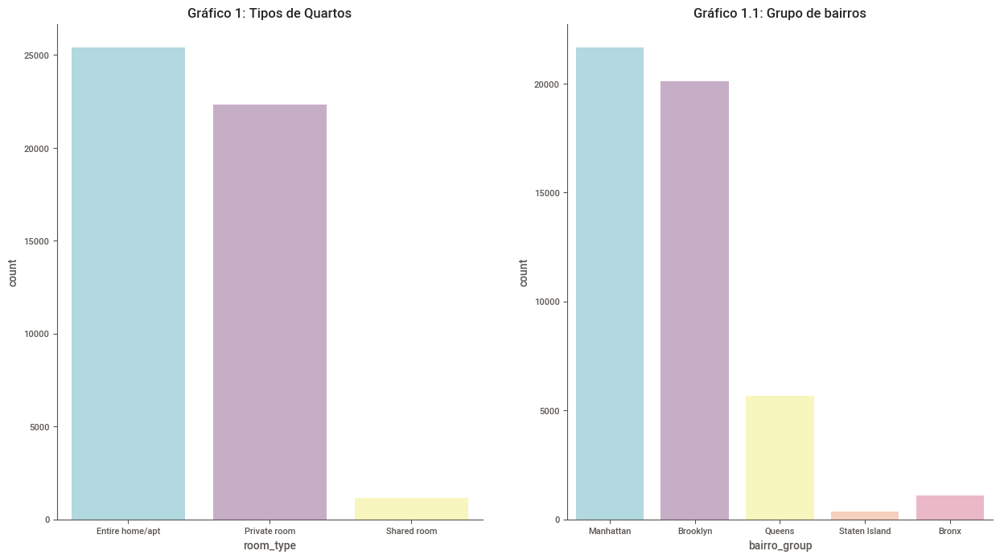

In [179]:
# observando o comportamento de algumas variáveis

sns.set_palette(['#abdee6', '#cbaacb', '#ffffb5', '#ffccb6', '#f3b0c3'])
fig, ax = plt.subplots(1, 2, figsize = (15, 8))

sns.countplot(data = df, x = 'room_type', ax = ax[0])
ax[0].set_title('Gráfico 1: Tipos de Quartos')
ax[0].spines['top'].set_visible(False)
ax[0].spines['right'].set_visible(False)

sns.countplot(data = df, x = 'bairro_group', ax = ax[1])
ax[1].set_title('Gráfico 1.1: Grupo de bairros')
ax[1].spines['top'].set_visible(False)
ax[1].spines['right'].set_visible(False)

plt.show()

**Quais são as principais diferenças nos preços de aluguel entre diferentes tipos de propriedades e como essas diferenças podem ser explicadas?**

As diferenças entre os tipos de quartos e seus respectivos preços são:

- Entire home/apt - são imóveis completos, com quarto (às vezes mais de um), banheiro, cozinha, sala de estar e demais cômodos.
    - mais caros devido à comodidade que oferecem ao locador.

- Private room - quartos privados, possivelmente em imóveis compatilhados. Ou seja, nesse tipo de acomodação, você compartilha áreas comuns com outras pessoas e tem um quarto para si.
    - preços intermediários.

- shared room - quarto compartilhado, onde podem haver outras pessoas ou não.
    - tipo mais barato de acomodação.

Partiremos agora para análises mais complexas e aprofundadas, estudando as relações entre as variáveis.

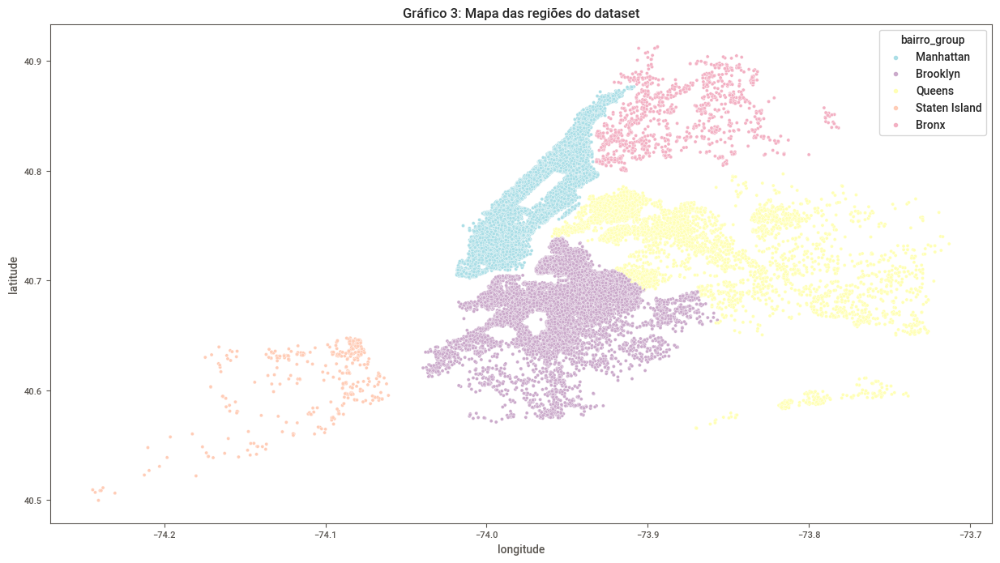

In [180]:
# mapa com as regiões que aparecem no dataset

plt.figure(figsize=(15, 8))
sns.scatterplot(data = df, x = 'longitude', y = 'latitude', hue = 'bairro_group')
plt.title('Gráfico 3: Mapa das regiões do dataset')
plt.show()

In [181]:
# diagrama de dispersão: tipos de quartos x preços

fig = px.box(df, x = 'room_type', y = 'price', color = 'room_type', 
             color_discrete_sequence = ['#abdee6', '#cbaacb', '#ffffb5'],
             labels = {'room_type': 'Tipos de quartos', 'price': 'Preços'},
             title = 'Gráfico 2: Tipos de quartos x Preços')

fig.update_layout(
    title = dict(font = dict(size = 20, family ='times new roman')),
    xaxis = dict(title = dict(font = dict(size = 13))),
    yaxis = dict(title = dict(font = dict(size = 13)))
)

fig.show()

#### Existe uma relação entre o tipo de quarto e o preço do aluguel? Quais tipos de quartos são mais lucrativos?

O gráfico de dispersão que representa a relação entre tipos de quartos e seus preços indica que:

    1) Entire homes/apts e Private rooms tem valores mais elevados quando comparados aos shared rooms;
    
    2) os valores mais elevados de aluguéis são os de casas e apartamentos;
    
    3) shared rooms tem sempre valor inferior a 2K.
    
    4) concluímos que os quartos mais lucrativos são os do tipo Entire home/apt.

In [182]:
# Diagrama de dispersão: tipos de quartos x preços x grupo de bairros

fig = px.scatter(df, x = 'room_type', y = 'price', color = 'bairro_group',
                labels = {'room_type': 'Tipos de quartos', 'price': 'Preços'},
                size_max = 200, opacity = 0.7, 
                color_discrete_sequence = ['#abdee6', '#cbaacb', '#ffffb5', '#ffccb6', '#f3b0c3'])

fig.update_layout(
    title = 'Gráfico 4: Tipo de quarto x preços x grupos de bairros',
    xaxis_title = 'Tipos de quartos',
    yaxis_title = 'Preços',
    font = dict(size = 13),
    title_font = dict(size = 20, family = 'times new roman')
)

fig.show()

De acordo com o diagrama, os valores mais elevados de quartos, tanto nos private rooms, quanto nos Entire homes/apts, se concentram em Manhattan e no Brooklyn. Por sua vez, quando o assunto são os Shared rooms, os valores mais elevados são encontrados em Queens.

Entre as hipóteses que levantei sobre a concentração de imóveis para alugar e os valores serem maiores em Manhattan e no Brooklyn estão nos seguintes fatos:

- **Manhattan**

É o bairro mais visitado de Nova York, tanto que as pessoas tendem a associar a visão da cidade diretamente a ele. É pequeno, porém é o mais populoso dos bairros de NYC.
Também é o lar de Wall Street, a Reserva Federal, a Bolsa de Valores de Nova York e algumas das instituições financeiras mais poderosas do mundo.

- **Brooklyn**

Segundo bairro mais conhecido de Nova York. Já foi a maior quarta cidade dos EUA - antes de virar uma região da cidade. Abriga o Dumbo, Williamsburg e Coney Island.

---------------------------------------------------------------------------------------------------------------------------

**c.	Existe algum padrão no texto do nome do local para lugares de mais alto valor?**

Consequentemente ao citado acima, quaisquer imóveis a alugar nesses bairros tendem a ter preços mais elevados quando comparados aos demais locais.

In [183]:
df.groupby('nome')['price'].mean().reset_index()

,nome,price
0,1 Bed Apt in Utopic Williamsburg,155.00
1,2-3 bedroom UWS garden triplex,300.00
2,3 bedroom loft in Williamsburg,500.00
3,A charming Space in Brooklyn,95.00
4,AMAZING TIME SQUARE!!BRICK WALLS!!,115.00
...,...,...
47899,한성 韓城 Han B (2F),48.00
47900,한성 韓城 Han C (2F),45.00
47901,️CENTRALLY LOCATED️- Great for Families + Groups,499.00
47902,ｳｨﾘｱﾑｽﾞﾊﾞｰｸﾞのかわいいお部屋です2,66.00


In [6]:
df[['room_type', 'bairro_group']].value_counts().reset_index()

,room_type,bairro_group,0
0,Entire home/apt,Manhattan,13199
1,Private room,Brooklyn,10131
2,Entire home/apt,Brooklyn,9559
3,Private room,Manhattan,7982
4,Private room,Queens,3372
5,Entire home/apt,Queens,2096
6,Private room,Bronx,652
7,Shared room,Manhattan,480
8,Shared room,Brooklyn,413
9,Entire home/apt,Bronx,379


Os dados agrupados acima confirmam as informações do gráfico 4. Temos Manhattam e Brooklyn com a maior concentração de quartos dos tipos Entire home/apt e Private Room.

In [184]:
df[['bairro_group', 'numero_de_reviews']].value_counts(ascending = False).reset_index()

,bairro_group,numero_de_reviews,0
0,Manhattan,0,5029
1,Brooklyn,0,3657
2,Manhattan,1,2377
3,Brooklyn,1,2233
4,Manhattan,2,1544
...,...,...,...
1164,Bronx,231,1
1165,Bronx,227,1
1166,Bronx,219,1
1167,Bronx,206,1


In [185]:
# para analisar os preços de cada bairro, optei por utilizar a mediana, já que existem outliers nos dados dos valores

pd.set_option('display.float_format', lambda x: '%.2f' % x)

media_staten = df.query("bairro_group == 'Staten Island'").median()
print(media_staten)

id                              22977021.00
host_id                         92493393.00
latitude                              40.62
longitude                            -74.09
price                                 75.00
minimo_noites                          2.00
numero_de_reviews                     12.00
reviews_por_mes                        1.41
calculado_host_listings_count          1.00
disponibilidade_365                  219.00
dtype: float64


In [186]:
media_bronx = df.query("bairro_group == 'Bronx'").median()
media_bronx

id                              23879304.00
host_id                         91320722.00
latitude                              40.85
longitude                            -73.89
price                                 65.00
minimo_noites                          2.00
numero_de_reviews                      9.00
reviews_por_mes                        1.38
calculado_host_listings_count          1.00
disponibilidade_365                  148.00
dtype: float64

In [187]:
media_brooklyn = df.query("bairro_group == 'Brooklyn'").median()
media_brooklyn

id                              18876659.00
host_id                         22920335.00
latitude                              40.69
longitude                            -73.95
price                                 90.00
minimo_noites                          3.00
numero_de_reviews                      6.00
reviews_por_mes                        0.66
calculado_host_listings_count          1.00
disponibilidade_365                   28.00
dtype: float64

In [188]:
media_queens = df.query("bairro_group == 'Queens'").median()
media_queens

id                              22564596.00
host_id                         68271464.00
latitude                              40.74
longitude                            -73.90
price                                 75.00
minimo_noites                          2.00
numero_de_reviews                      7.00
reviews_por_mes                        1.21
calculado_host_listings_count          1.00
disponibilidade_365                   98.00
dtype: float64

In [189]:
media_manhattan = df.query("bairro_group == 'Manhattan'").median()
media_manhattan

id                              19116844.00
host_id                         30656279.00
latitude                              40.76
longitude                            -73.98
price                                150.00
minimo_noites                          3.00
numero_de_reviews                      4.00
reviews_por_mes                        0.61
calculado_host_listings_count          1.00
disponibilidade_365                   36.00
dtype: float64

**Quais são os bairros mais lucrativos para investir em propriedades para aluguel na plataforma?**

**a.	Supondo que uma pessoa esteja pensando em investir em um apartamento para alugar na plataforma, onde seria mais indicada a compra?**

os bairros onde os preços são mais elevados são o Brooklyn e Manhattan, como já esperado. Entretanto, caso sigamos a lógica de onde as pessoas mais alugam, teremos o Staten Island, Queens e o Bronx. 
Os valores medianos de aluguéis em cada um desses bairros é:

- Bronx: 65.00

- Staten Island: 75.00

- Queens: 75.00

- Brooklyn: 90.00

- Manhattan: 150.00

Com isso, apresento a opção indicada como resposta à questão levantada:

    a) investir em um imóvel nos bairros mais caros, devido ao preço de alguel e o número de visitas que eles recebem.
    - São eles Brooklyn e Manhattan.

In [286]:
df[['price', 'minimo_noites', 'disponibilidade_365']].corr()

,price,minimo_noites,disponibilidade_365
price,1.00,0.04,0.08
minimo_noites,0.04,1.00,0.14
disponibilidade_365,0.08,0.14,1.00


**b. O número mínimo de noites e a disponibilidade ao longo do ano interferem no preço?**

Segundo o cálculo da correlação entre as variáveis, o número mínimo de noites e a disponibilidade durante o ano não interferem de maneira significativa no preço dos dados fornecidos.

Manhattan       44.30
Brooklyn        41.12
Queens          11.59
Bronx            2.23
Staten Island    0.76
Name: bairro_group, dtype: float64


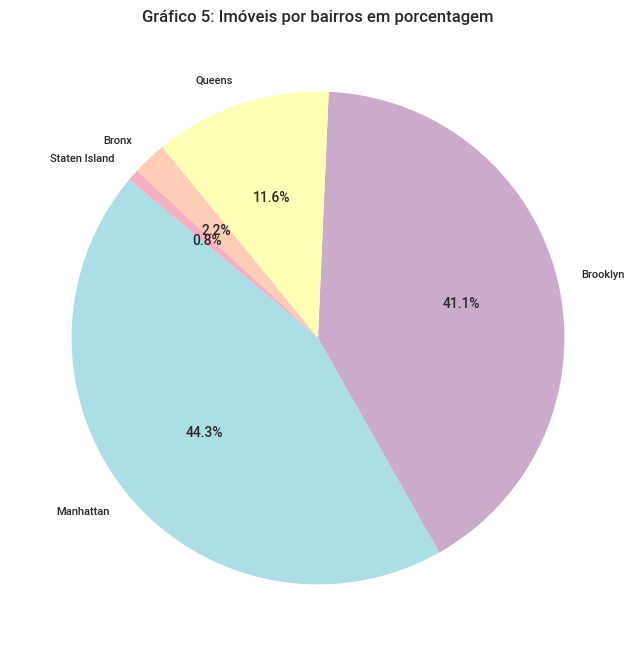

In [190]:
# porcentagem de propriedades por região

perc_bairro = df['bairro_group'].value_counts(normalize = True) * 100
print(perc_bairro)

cores = ['#abdee6', '#cbaacb', '#ffffb5', '#ffccb6', '#f3b0c3']

plt.figure(figsize = (8, 8))
plt.pie(perc_bairro, labels = perc_bairro.index, autopct = '%1.1f%%', startangle = 140, colors = cores)
plt.title('Gráfico 5: Imóveis por bairros em porcentagem')
plt.show()

In [191]:
fig = px.box(df, x = 'bairro_group', y = 'disponibilidade_365', color = 'bairro_group',
             color_discrete_map = {'A': '#abdee6', 'B': '#cbaacb', 'C': '#ffffb5', 'D': '#ffccb6', 'E': '#f3b0c3'})

fig.update_layout(title = 'Gráfico 6: Boxplot com a Disponibilidade por Bairro',
                  xaxis_title ='Bairros',
                  yaxis_title ='Disponibilidade')
fig.show()

In [59]:
# histograma com preços x reviews

fig = px.histogram(df, x = 'price', y = 'numero_de_reviews', marginal = 'rug', color = 'bairro_group',
                   color_discrete_sequence = ['#abdee6', '#cbaacb', '#ffffb5', '#ffccb6', '#f3b0c3'],
                   labels = {'price': 'Preço', 'numero_de_reviews': 'Número de Reviews'},
                   title = ' Gráfico 7: Histograma com o Preço e Número de Reviews por Bairro')

fig.show()

In [293]:
df[['price', 'numero_de_reviews']].corr()

,price,numero_de_reviews
price,1.00,-0.05
numero_de_reviews,-0.05,1.00


**Há uma relação entre o número de reviews e o preço do aluguel? Os locais com mais reviews tendem a ter preços mais altos?**

O histograma com a distribuição dos dados mostra que os imóveis com preços moderados possuem um número de avaliações maior no site analisado. Isso se deve ao segundo princípio da economia: custo de oportunidade. 

O significado por trás desse conceito econômico de Mankiw é que as pessoas estão dispostas a abrir mão de algo - nesse caso, o conforto de ter um imóvel maior ou em um bairro mais famoso - com o objetivo de economizar e poder usufruir do valor poupado no futuro.

A correlaçao entre as variáveis indica que, quando o preço sobe, as reviews tendem a cair - e vice-versa. Isso possivelmente pode ser explicado pelo fato de que os visitantes, mesmo estando nos bairros mais caros, tendem a procurar por imóveis mais acessíveis.

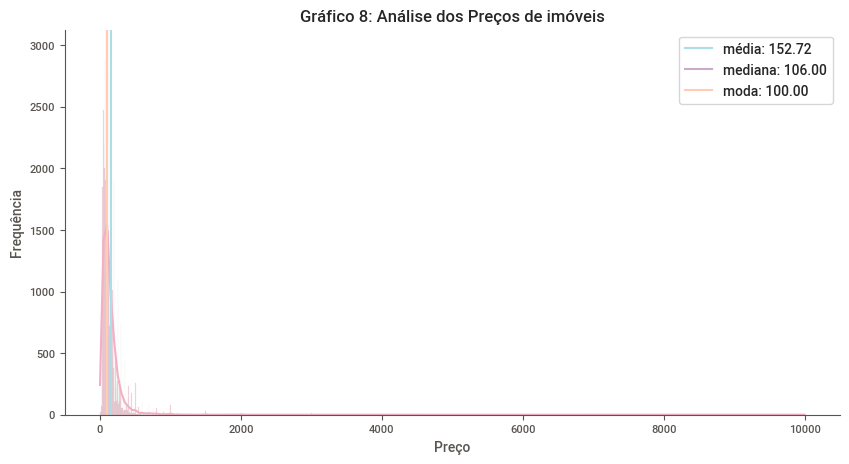

In [292]:
# histograma com média, moda e mediana de preços contidos no dataset. Análise de assimetria dos dados e curtose

plt.figure(figsize = (10, 5))
sns.histplot(df['price'], kde = True, color = '#f3b0c3')
plt.xlabel('Preço')
plt.ylabel('Frequência')
plt.title('Gráfico 8: Análise dos Preços de imóveis')

media = df['price'].mean()
mediana = df['price'].median()
moda = df['price'].mode()[0]

plt.axvline(media, color = '#abdee6', linestyle = '-', label = f'média: {media:.2f}')
plt.axvline(mediana, color = '#cbaacb', linestyle = '-', label = f'mediana: {mediana:.2f}')
plt.axvline(moda, color = '#ffccb6', linestyle = '-', label = f'moda: {moda:.2f}')
plt.legend()

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.show()

**Assimetria:** mede o quão assimétricos são os dados;

**Curtose:** mede o achatamento da curva de uma função de distribuição de frequências.

Analisando o histograma de preços, podemos inferir que os dados sobre essa variável (que são extremamente importantes para o desenvolvimento do modelo) são **assimétricos à direita** e positivos, com curva **platicúrtica** - alto achatamento.

Quando a distribuição é assimétrica e estamos trabalhando com machine learning, é interessante normalizar os dados para que o modelo funcione da melhor maneira possível e apresente resultados precisos. No caso da distribuição da variável em destaque, é recomedado que se utilize a transformação logarítmica, onde:

para cada valor __x__ nos seus dados, você calcula __log⁡(x + 1)__ em vez de __log⁡(x)__, como forma de evitar problemas quando __x = 0__.


## Cleaning

In [222]:
# vamos analisar os valores nulos da tabela

df.isnull().sum()

id                                   0
nome                                16
host_id                              0
host_name                           21
bairro_group                         0
bairro                               0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimo_noites                        0
numero_de_reviews                    0
ultima_review                    10052
reviews_por_mes                  10052
calculado_host_listings_count        0
disponibilidade_365                  0
price_log                            0
dtype: int64

### Lidando com a normalização dos valores de preço

In [219]:
df = pd.read_csv('teste_indicium_precificacao.csv')

In [287]:
# normalizando devido à assimetria e à curtose

df['price_log'] = np.log(df.price + 1)

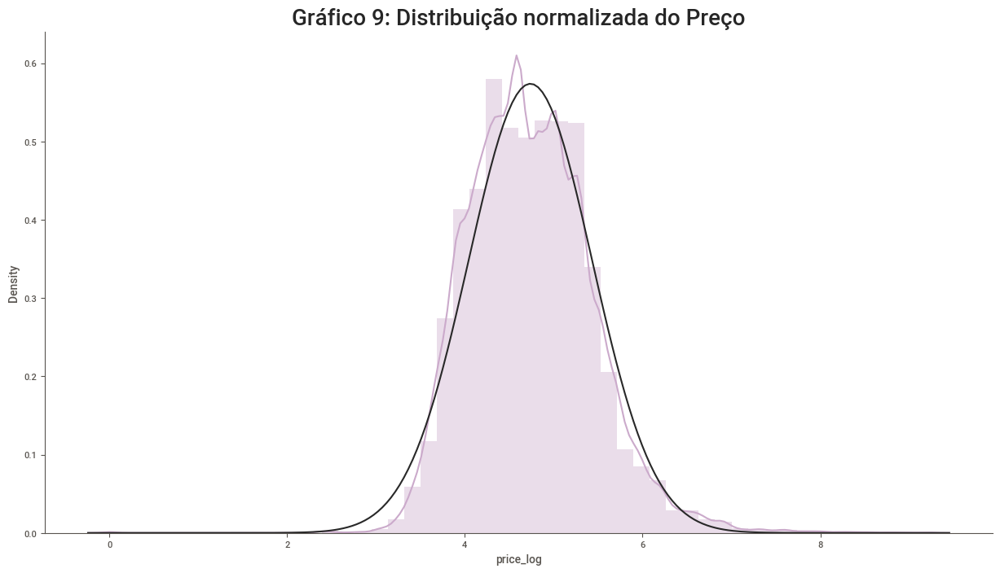

In [291]:
from scipy.stats import norm

plt.figure(figsize = (15, 8))
sns.distplot(df['price_log'], fit = norm, color = '#cbaacb')
plt.title('Gráfico 9: Distribuição normalizada do Preço', size = 20, weight = 'bold')

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.show()

Agora que os valores foram normalizados e a coluna price_log foi criada, podemos lidar com as variáveis categóricas do dataset, dropando aquelas que não serão úteis ao modelo e fazendo transformações naquelas que são relevantes.

### lidando com colunas categóricas que não serão importantes para o modelo

In [223]:
df.drop(['id', 'host_id', 'host_name', 'ultima_review', 'nome',], axis = 1, inplace =  True)
df.isnull().sum()

bairro_group                         0
bairro                               0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimo_noites                        0
numero_de_reviews                    0
reviews_por_mes                  10052
calculado_host_listings_count        0
disponibilidade_365                  0
price_log                            0
dtype: int64

In [224]:
# preenchendo colunas de reviews por mês com a média desses valores

media = df['reviews_por_mes'].mean()
df['reviews_por_mes'].fillna(media, inplace = True)

## Machine Learning

In [225]:
# divisão em treino e validação

modelo_train = df.sample(frac = 0.7, random_state = 42)
modelo_val = df.drop(modelo_train.index)

### OneHotEncoder

In [226]:
# atribuindo "valores" às colunas cujas variáveis são categóricas

from category_encoders import OneHotEncoder

colunas_cat = ['bairro_group', 'bairro', 'room_type']
enc = OneHotEncoder(cols = colunas_cat, use_cat_names = True)
enc.fit(modelo_train)

OneHotEncoder(cols=['bairro_group', 'bairro', 'room_type'], use_cat_names=True)

In [227]:
# aplicando ao modelo de treino

modelo_train_ohe = enc.transform(modelo_train)
modelo_train_ohe

,bairro_group_Manhattan,bairro_group_Brooklyn,bairro_group_Queens,bairro_group_Bronx,bairro_group_Staten Island,bairro_Harlem,bairro_East Flatbush,bairro_Flatbush,bairro_Fort Greene,bairro_Edgemere,...,room_type_Private room,room_type_Entire home/apt,room_type_Shared room,price,minimo_noites,numero_de_reviews,reviews_por_mes,calculado_host_listings_count,disponibilidade_365,price_log
879,1,0,0,0,0,1,0,0,0,0,...,1,0,0,110,3,47,0.57,1,248,4.71
47429,0,1,0,0,0,0,1,0,0,0,...,1,0,0,40,1,1,1.00,2,151,3.71
15394,0,1,0,0,0,0,0,1,0,0,...,1,0,0,57,3,33,0.85,3,345,4.06
24100,0,1,0,0,0,0,0,0,1,0,...,0,1,0,375,2,14,0.60,1,75,5.93
16332,0,0,1,0,0,0,0,0,0,1,...,1,0,0,195,4,0,1.37,1,0,5.28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10757,0,1,0,0,0,0,0,0,0,0,...,1,0,0,52,2,6,2.09,1,90,3.97
48021,0,0,1,0,0,0,0,0,0,0,...,0,1,0,120,1,0,1.37,1,264,4.80
9054,1,0,0,0,0,0,0,0,0,0,...,1,0,0,89,3,1,0.02,2,0,4.50
10041,0,1,0,0,0,0,0,0,0,0,...,1,0,0,45,4,52,1.09,1,341,3.83


In [228]:
# aplicando ao modelo de teste

modelo_val_ohe = enc.transform(modelo_val)
modelo_val_ohe.head(4)

,bairro_group_Manhattan,bairro_group_Brooklyn,bairro_group_Queens,bairro_group_Bronx,bairro_group_Staten Island,bairro_Harlem,bairro_East Flatbush,bairro_Flatbush,bairro_Fort Greene,bairro_Edgemere,...,room_type_Private room,room_type_Entire home/apt,room_type_Shared room,price,minimo_noites,numero_de_reviews,reviews_por_mes,calculado_host_listings_count,disponibilidade_365,price_log
2,0,1,0,0,0,0,0,0,0,0,...,0,1,0,89,1,270,4.64,1,194,4.50
5,0,1,0,0,0,0,0,0,0,0,...,1,0,0,60,45,49,0.40,1,0,4.11
9,1,0,0,0,0,0,0,0,0,0,...,0,1,0,135,5,53,0.43,1,6,4.91
10,1,0,0,0,0,0,0,0,0,0,...,1,0,0,85,2,188,1.50,1,39,4.45


In [229]:
# árvore da decisão

x_train = modelo_train_ohe.drop('price_log', axis = 1)
x_val = modelo_val_ohe.drop('price_log', axis = 1)

y_train = modelo_train_ohe['price_log']
y_val = modelo_val_ohe['price_log']

In [230]:
mdl = RandomForestRegressor(n_jobs = 6, n_estimators = 100, random_state = 22)
mdl.fit(x_train, y_train)

RandomForestRegressor(n_jobs=6, random_state=22)

In [231]:
p_ohe = mdl.predict(x_val)

In [232]:
# erro médio absoluto do modelo

mean_absolute_error(y_val, p_ohe)

9.470969382124234e-05

### ordinal

In [233]:
from category_encoders.ordinal import OrdinalEncoder 

colunas_cat = ['bairro_group', 'bairro', 'room_type']
enc = OrdinalEncoder(cols = colunas_cat)
enc.fit(modelo_train)

OrdinalEncoder(cols=['bairro_group', 'bairro', 'room_type'],
               mapping=[{'col': 'bairro_group', 'data_type': dtype('O'),
                         'mapping': Manhattan        1
Brooklyn         2
Queens           3
Bronx            4
Staten Island    5
NaN             -2
dtype: int64},
                        {'col': 'bairro', 'data_type': dtype('O'),
                         'mapping': Harlem             1
East Flatbush      2
Flatbush           3
Fort Greene        4
Edgemere           5
                ... 
Westerleigh      214
Silver Lake      215
Eltingville      216
Woodrow          217
NaN               -2
Length: 218, dtype: int64},
                        {'col': 'room_type', 'data_type': dtype('O'),
                         'mapping': Private room       1
Entire home/apt    2
Shared room        3
NaN               -2
dtype: int64}])

In [234]:
modelo_train_ord = enc.transform(modelo_train)
modelo_train_ord.head()

,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,reviews_por_mes,calculado_host_listings_count,disponibilidade_365,price_log
879,1,1,40.80,-73.95,1,110,3,47,0.57,1,248,4.71
47429,2,2,40.65,-73.95,1,40,1,1,1.00,2,151,3.71
15394,2,3,40.65,-73.96,1,57,3,33,0.85,3,345,4.06
24100,2,4,40.69,-73.98,2,375,2,14,0.60,1,75,5.93
16332,3,5,40.60,-73.77,1,195,4,0,1.37,1,0,5.28


In [235]:
modelo_val_ord = enc.transform(modelo_val)
modelo_val_ord.head(4)

,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,reviews_por_mes,calculado_host_listings_count,disponibilidade_365,price_log
2,2,11.00,40.69,-73.96,2,89,1,270,4.64,1,194,4.50
5,2,9.00,40.69,-73.96,1,60,45,49,0.40,1,0,4.11
9,1,33.00,40.80,-73.97,2,135,5,53,0.43,1,6,4.91
10,1,34.00,40.76,-73.99,1,85,2,188,1.50,1,39,4.45


In [236]:
x_train = modelo_train_ord.drop('price_log', axis = 1)
x_val = modelo_val_ord.drop('price_log', axis = 1)

y_train = modelo_train_ord['price_log']
y_val = modelo_val_ord['price_log']

mdl = RandomForestRegressor(n_jobs = 6, n_estimators = 100, random_state = 22)
mdl.fit(x_train, y_train)

RandomForestRegressor(n_jobs=6, random_state=22)

In [313]:
p_ord = mdl.predict(x_val)

In [238]:
mean_absolute_error(y_val, p_ord)

8.741777539225682e-05

In [314]:
with open('mdl_randomforest', 'wb') as arquivo_pkl:
     pickle.dump(mdl, arquivo_pkl)

### Target Encoding 

In [239]:
from category_encoders.target_encoder import TargetEncoder

enc = TargetEncoder(cols = colunas_cat)
enc.fit(modelo_train, modelo_train['price_log'])
modelo_train_tgt = enc.transform(modelo_train)

In [240]:
modelo_train_tgt.head(4)

,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,reviews_por_mes,calculado_host_listings_count,disponibilidade_365,price_log
879,5.01,4.57,40.80,-73.95,4.31,110,3,47,0.57,1,248,4.71
47429,4.58,4.31,40.65,-73.95,4.31,40,1,1,1.00,2,151,3.71
15394,4.58,4.33,40.65,-73.96,4.31,57,3,33,0.85,3,345,4.06
24100,4.58,4.84,40.69,-73.98,5.15,375,2,14,0.60,1,75,5.93


In [241]:
modelo_val_tgt = enc.transform(modelo_val)

In [242]:
x_train = modelo_train_tgt.drop('price_log', axis = 1)
x_val = modelo_val_tgt.drop('price_log', axis = 1)

y_train = modelo_train_tgt['price_log']
y_val = modelo_val_tgt['price_log']

mdl = RandomForestRegressor(n_jobs = 6, n_estimators = 100, random_state = 22)
mdl.fit(x_train, y_train)

RandomForestRegressor(n_jobs=6, random_state=22)

In [243]:
p_tgt = mdl.predict(x_val)

In [271]:
mean_absolute_error(y_val, p_tgt)

9.080914447614011e-05

### Regressão Linear

In [262]:
x_train.drop(['numero_de_reviews', 'reviews_por_mes', 'calculado_host_listings_count', 'minimo_noites', 'disponibilidade_365'], axis = 1)
x_val.drop(['numero_de_reviews', 'reviews_por_mes', 'calculado_host_listings_count', 'minimo_noites', 'disponibilidade_365'], axis = 1)

,bairro_group,bairro,latitude,longitude,room_type,price
2,4.58,4.83,40.69,-73.96,5.15,89
5,4.58,4.45,40.69,-73.96,4.31,60
9,5.01,5.03,40.80,-73.97,5.15,135
10,5.01,5.13,40.76,-73.99,4.31,85
12,5.01,5.03,40.80,-73.96,4.31,85
...,...,...,...,...,...,...
48879,4.58,4.75,40.71,-73.94,5.15,120
48883,4.58,4.75,40.72,-73.96,4.31,190
48888,4.39,4.39,40.69,-73.81,4.31,65
48889,4.58,4.45,40.68,-73.95,4.31,70


In [263]:
lr = LinearRegression()

In [264]:
lr.fit(x_train, y_train)

LinearRegression()

In [265]:
c = lr.intercept_
c

-24.103656296697896

In [266]:
m = lr.coef_
m

array([ 1.03775872e-01,  5.16130638e-01,  1.24531752e-01, -2.34000681e-01,
        6.96479124e-01,  1.23517523e-03, -2.19828687e-03, -4.33606151e-04,
        5.02040285e-03, -2.90879717e-04,  4.87671950e-04])

In [267]:
y_predict_train = lr.predict(x_train) 
y_predict_train

array([4.39684465, 4.08593723, 4.19816413, ..., 4.5073988 , 4.14568342,
       4.7128201 ])

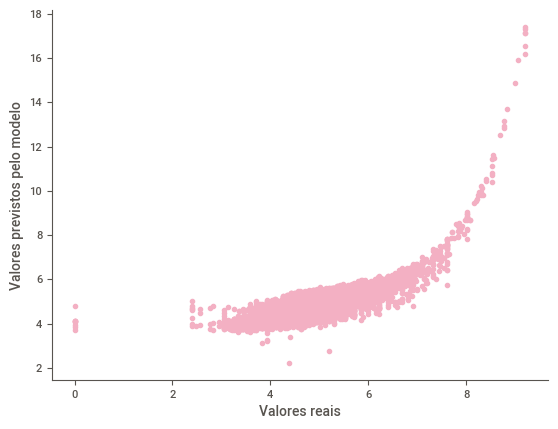

In [289]:
plt.scatter(y_train, y_predict_train, color = '#f3b0c3')
plt.xlabel('Valores reais')
plt.ylabel('Valores previstos pelo modelo')

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.show()

In [269]:
r2_score(y_train, y_predict_train)

0.705260070900708

In [270]:
mean_squared_error(y_train, y_predict_train)

0.14254602463578925

## Conclusão

#### Perguntas

**a.	Supondo que uma pessoa esteja pensando em investir em um apartamento para alugar na plataforma, onde seria mais indicada a compra?**

Quais são os bairros mais lucrativos para investir em propriedades para aluguel na plataforma?

os bairros onde os preços são mais elevados são o Brooklyn e Manhattan, como já esperado. Entretanto, caso sigamos a lógica de onde as pessoas mais alugam, teremos o Staten Island, Queens e o Bronx. Os valores medianos de aluguéis em cada um desses bairros é:

    Bronx: 65.00

    Staten Island: 75.00

    Queens: 75.00

    Brooklyn: 90.00

    Manhattan: 150.00

Com isso, apresento a opção indicada como resposta à questão levantada:

a) investir em um imóvel nos bairros mais caros, devido ao preço de alguel e o número de visitas que eles recebem.
- São eles Brooklyn e Manhattan.

---------------------------------------------------------------------------------------------------------------------------

**b.	O número mínimo de noites e a disponibilidade ao longo do ano interferem no preço?**

Segundo o cálculo da correlação entre as variáveis, o número mínimo de noites e a disponibilidade durante o ano não interferem de maneira significativa no preço dos dados fornecidos.

---------------------------------------------------------------------------------------------------------------------------

**c.	Existe algum padrão no texto do nome do local para lugares de mais alto valor?**

De acordo com o diagrama, os valores mais elevados de quartos, tanto nos private rooms, quanto nos Entire homes/apts, se concentram em Manhattan e no Brooklyn. Por sua vez, quando o assunto são os Shared rooms, os valores mais elevados são encontrados em Queens.

Entre as hipóteses que levantei sobre a concentração de imóveis para alugar e os valores serem maiores em Manhattan e no Brooklyn estão nos seguintes fatos:

    Manhattan

É o bairro mais visitado de Nova York, tanto que as pessoas tendem a associar a visão da cidade diretamente a ele. É pequeno, porém é o mais populoso dos bairros de NYC. Também é o lar de Wall Street, a Reserva Federal, a Bolsa de Valores de Nova York e algumas das instituições financeiras mais poderosas do mundo.

    Brooklyn

Segundo bairro mais conhecido de Nova York. Já foi a maior quarta cidade dos EUA - antes de virar uma região da cidade. Abriga o Dumbo, Williamsburg e Coney Island.

Consequentemente ao citado acima, quaisquer imóveis a alugar nesses bairros tendem a ter preços mais elevados quando comparados aos demais locais.



**3.	Explique como você faria a previsão do preço a partir dos dados. Quais variáveis e/ou suas transformações você utilizou e por quê? Qual tipo de problema estamos resolvendo (regressão, classificação)? Qual modelo melhor se aproxima dos dados e quais seus prós e contras? Qual medida de performance do modelo foi escolhida e por quê?**

O modelo que melhor se adequou às características das variáveis foi o RandomForestRegressor com transformação de categóricas por meio do método Ordinal, onde o modelo obteve erro absoluto de 8.74. Tratou-se de um caso de regressão, já que a variável de saída ('price') é contínua.

- prós: interpretabilidade e facilidade para implemetação;

- contras: perda de informação em alguns casos e pode gerar assunções errôneas.

Durante o tratamento dos dados, realizei transformação logarítmica, que é a mais indicada para dados assimétricos à direita e de achatamento considerável. Todas as variáveis, exceto 'id', 'host_id', 'host_name', 'ultima_review', 'nome', foram utilizadas no modelo - as que foram retiradas não possuiam nenhuma influência sobre o preço, portanto fora dropadas nessa etapa.

Por fim, a medida de performance que eu optei por utilizar foi o MAE, mean absolute error, justamente pela sua facilidade de aplicação e interpretação. Ele faz uma média entre as diferenças de valores do modelo de previsão e dos valores reais, além de ser pouco sensível a outliners - que estão presentes nesse dataset, principalmente nos bairros mais caros.

**4.Supondo um apartamento com as seguintes características:**

{'id': 2595,
 'nome': 'Skylit Midtown Castle',
 'host_id': 2845,
 'host_name': 'Jennifer',
 'bairro_group': 'Manhattan',
 'bairro': 'Midtown',
 'latitude': 40.75362,
 'longitude': -73.98377,
 'room_type': 'Entire home/apt',
 'price': 225,
 'minimo_noites': 1,
 'numero_de_reviews': 45,
 'ultima_review': '2019-05-21',
 'reviews_por_mes': 0.38,
 'calculado_host_listings_count': 2,
 'disponibilidade_365': 355}

Qual seria a sua sugestão de preço?

levando em consideração o preço por dia e a disponibilidade durante o ano, a sugestão de preço ao imóvel seria de aproximadamente U$80.000,00

In [299]:
caracteristicas = {'id': 2595, 
          'nome': 'Skylit Midtown Castle', 
          'host_id': 2845, 
          'host_name': 'Jennifer', 
          'bairro_group': 'Manhattan', 
          'bairro': 'Midtown', 
          'latitude': 40.75362, 
          'longitude': -73.98377, 
          'room_type': 'Entire home/apt', 
          'price': 225, 
          'minimo_noites': 1, 
          'numero_de_reviews': 45, 
          'ultima_review': '2019-05-21', 
          'reviews_por_mes': 0.38, 
          'calculado_host_listings_count': 2,
          'disponibilidade_365': 355}

imovel = pd.DataFrame([caracteristicas], index = ['id'])

imovel.head()

,id,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,ultima_review,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
id,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75,-73.98,Entire home/apt,225,1,45,2019-05-21,0.38,2,355


#### Precificação

segundo os métodos de precificação, o valor mensal de aluguel é igual a algum valor entre 0.5% e 1% do valor total do imóvel. Com base na diária de 255 dólares e os 365 dias do ano, chegamos ao valor de 93.075 dólares. Dividimos, então, esse valor por 12 - correspondente aos meses de um ano -, o que resulta em 7.756,25 dólares ao mês.

Em seguida, com uma regra de três simples, chegamos ao valor de imóvel de aproximadamente U$1.551.250.

## Referências

**Youtube:**

- Universidade dos Dados

- Rodrigo Pescim

- Tiago Santana de Nazaré

- Jovian

- Mario Filho

**Sites:**
- https://www.hellotickets.com.br/estados-unidos/nova-york/bairros/sc-1-1564

- https://medium.com/turing-talks/turing-talks-10-introdu%C3%A7%C3%A3o-%C3%A0-predi%C3%A7%C3%A3o-a75cd61c268d

- https://www.kaggle.com/